In [1]:
import numpy as np
from scipy.stats import f

**Q1. Replicate our doughnut data but with each group having the same true mean.  Randomly simulate data.   Verify your F observed is above F critical 5% of the  the time.**

In [2]:
df1 = 4 - 1
df2 = 24 - 4
F_critical = f.ppf(1 - 0.05, 3, 20)
meansOfOilCategory = np.zeros(4)

meanOfVariancesList = np.zeros(100000)
varianceOfMeanList = np.zeros(100000)
cnt = 0
for i in range(100000):
  # Generate samples
  samplesOilCat1 = np.random.normal(73, 9, 6)
  meansOfOilCategory[0] = np.mean(samplesOilCat1)

  samplesOilCat2 = np.random.normal(73, 9, 6)
  meansOfOilCategory[1] = np.mean(samplesOilCat2)

  samplesOilCat3 = np.random.normal(73, 9, 6)
  meansOfOilCategory[2] = np.mean(samplesOilCat3)

  samplesOilCat4 = np.random.normal(73, 9, 6)
  meansOfOilCategory[3] = np.mean(samplesOilCat4)

  meanOfVariances = (np.var(samplesOilCat1, ddof = 1) + np.var(samplesOilCat2, ddof = 1) + np.var(samplesOilCat3, ddof = 1) + np.var(samplesOilCat4, ddof = 1))/4
  meanOfVariancesList[i] =  meanOfVariances

  varianceOfMean = np.var(meansOfOilCategory, ddof = 1)
  varianceOfMeanList[i] = varianceOfMean

  F_observed = 6*varianceOfMean / meanOfVariances
  if(F_observed > F_critical):
    cnt += 1
print(cnt/100000)

0.05102


In [3]:
# Verified that 5 % of the time the F observed is above F

**Q2. With question (1) verify the correlation between your observed mean of the variances and variance of the means is close to 0**

In [4]:
# Calculate correlation coefficient matrix
corr_matrix = np.corrcoef(meanOfVariancesList, varianceOfMeanList)

# Extract the correlation coefficient
corr_coefficient = corr_matrix[0, 1]
print(corr_coefficient)

-0.004015874157239698


In [5]:
# As we can see the correlation between observed mean of the variances and variance of the means is close to 0
# Verified

**Q 3. Four tropical feedstuffs were each fed to a lot of 5 baby chicks (9). The gains in weight where (mentined in the question)** 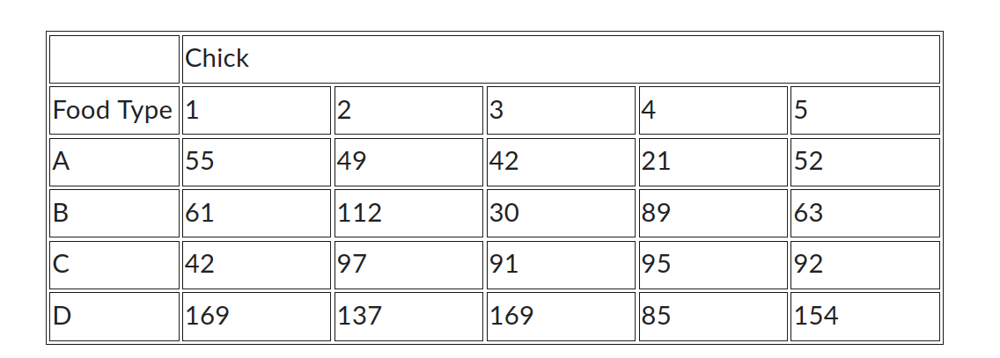

**a. Looking at your data does it look like each mean is more or less the same?**

Just by looking at the data it seems that mean for each food type is not the same, particularly if you look at Food type A and D we can observe the significant difference between the category means

**b. Perform an ANOVA**

In [6]:
meansOfFoodType = np.zeros(4)

foodTypeA = np.array([55, 49, 42, 21, 52])
meansOfFoodType[0] = np.mean(foodTypeA)

foodTypeB = np.array([61, 112, 30, 89, 63])
meansOfFoodType[1] = np.mean(foodTypeB)

foodTypeC = np.array([42, 97, 91, 95, 92])
meansOfFoodType[2] = np.mean(foodTypeC)

foodTypeD = np.array([169, 137, 169, 85, 154])
meansOfFoodType[3] = np.mean(foodTypeD)


meanOfVariances = (np.var(foodTypeA, ddof = 1) + np.var(foodTypeB, ddof = 1) + np.var(foodTypeC, ddof = 1) + np.var(foodTypeD, ddof = 1))/4
varianceOfMean = np.var(meansOfFoodType, ddof = 1)

F_observed = 5*varianceOfMean / meanOfVariances

In [7]:
df1 = 4 - 1
df2 = 5*4 - 4
F_critical = f.ppf(1 - 0.05, df1, df2 )

In [8]:
F_observed

12.006259242700422

In [9]:
F_critical

3.238871517453585

**c. State your conclusion**

As F_observed is greater than F_critical, we have to reject the null hypothesis (H0: There is no effect of category/food type on weight gain). There is statistically significant evidence that food type has some effect on weight gain of the chicks ie mean of the food type categories are not all the same

**Q4. This one is 2-factor ANOVA
In three species of citrus trees the ratio of leaf area to dry weight was determined for three conditions of shading**

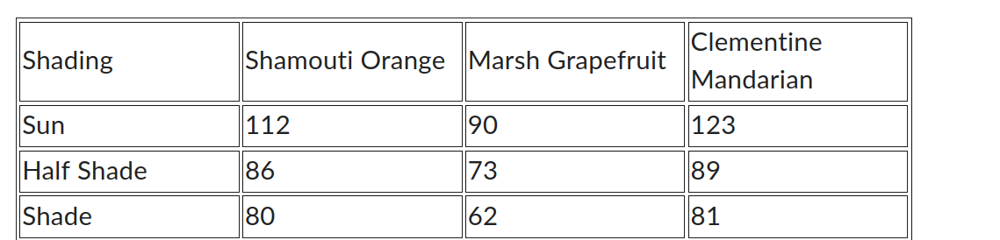

**a. Build a two factor model**

Our two factor model is ->

ratio of leaf area to dry weight = grand mean + adjustment for shading type (row type) + adjustment for plant species (column type) + normally distributed centered noise(iid)

Y = MUgrand + MUrowadjust + MUcoladjust + epsilon

epsilon ~ N(0, sigma)

**b. Find the sum of the residuals squared**

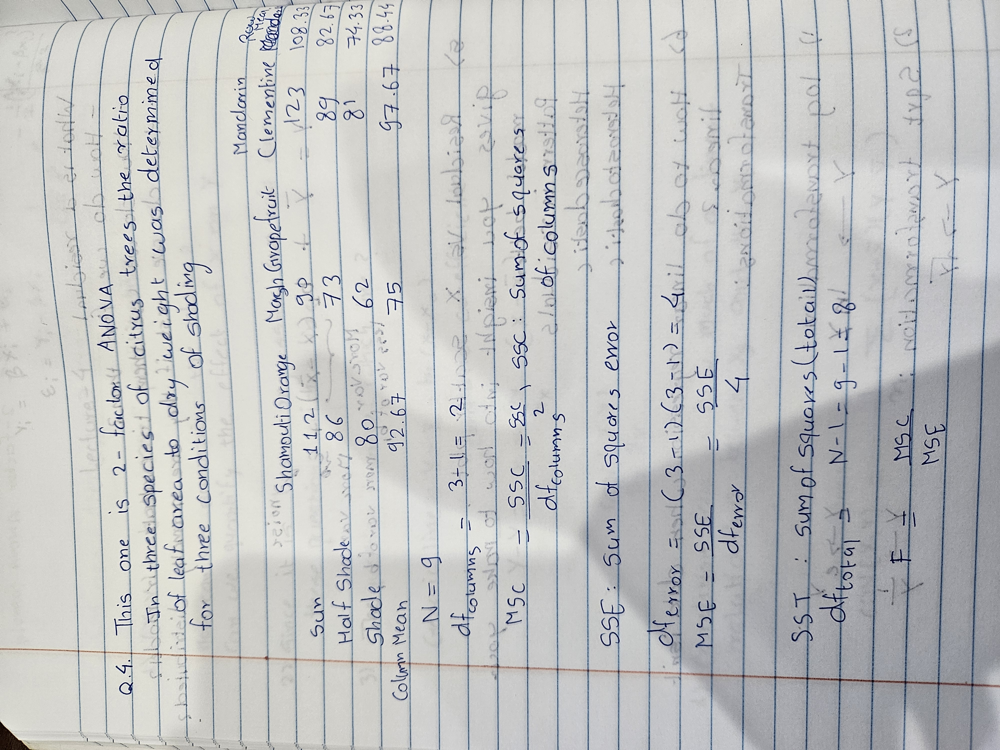

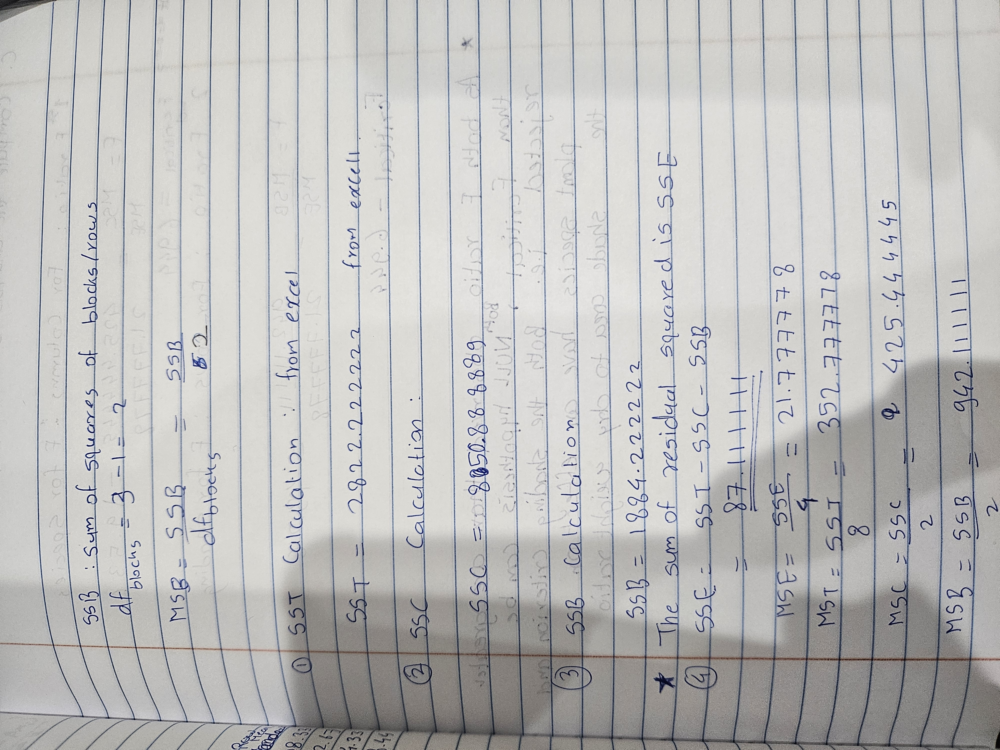

sum of residuals square is 87.111111

**c. Compute the analysis of variance: Hint for shading you should get F = 43.2**

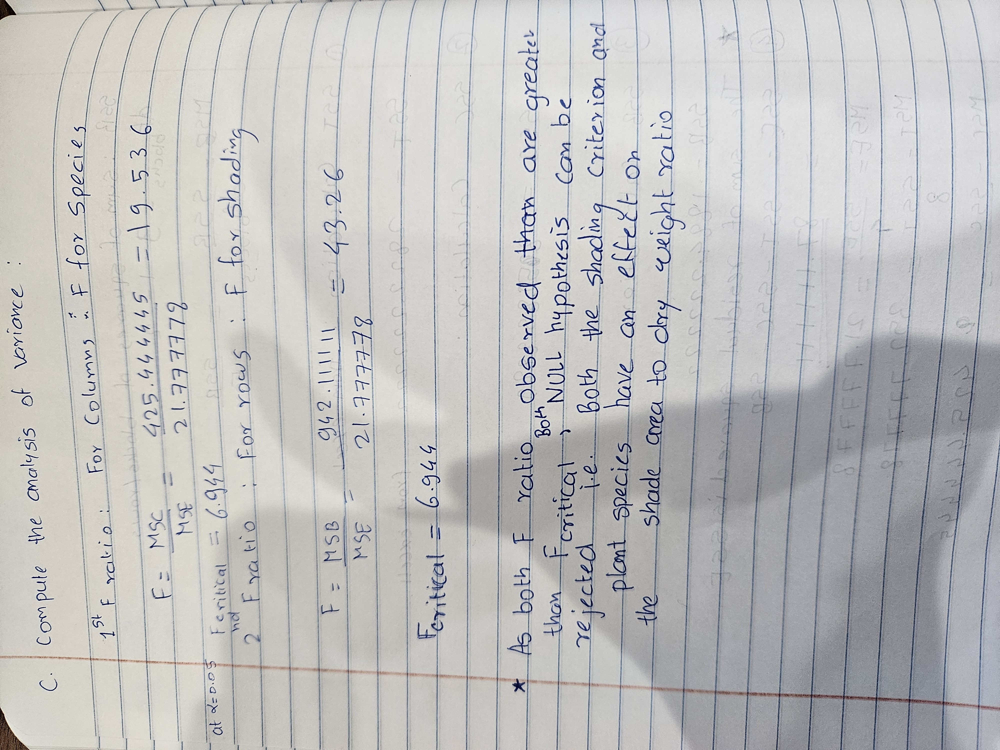